In [1]:
import os
import re
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import unicodecsv as csv
import seaborn as sns
from collections import Counter
from cycler import cycler
from textwrap import wrap
from IPython.display import display, HTML, Markdown

In [2]:
%%html
<style>
div.float-bar-whh {
    z-index: 10;
    position: fixed;
    bottom: 5px;
    width: 540px;
    left: 50%;
    right: 50%;
    padding-right: 0px;
    padding-left: 0px;
    margin-left: -270px;
    background: #333;
    opacity: 0.7;
    box-shadow: 0 0 2px 0px black;
}
span.new-name-whh {
    height: 100%;
    line-height: 1em;
    margin: 16px 16px 16px 16px;
    border: none;
    font-size: 146.5%;
    color: white;
    text-overflow: ellipsis;
    overflow: hidden;
    white-space: nowrap;
    border-radius: 2px;
    opacity: 1;
}
</style>

<div class="float-bar-whh">
    <center><span class="new-name-whh">Tech - software engineering</span></center>
</div>

# Analysize variables.

In [3]:
# Read documentation.
columns_file = r"../records_documentation.txt"

with open(columns_file,"r") as f:
    columns = f.readlines()
columns
        

['[Column 0] ID\n',
 '[Column 1] Birth year: deduced from education history, where available\n',
 '[Column 2] Gender flag: 1=female, 2=male, 0=unknown\n',
 '[Column 3] Skillset1: primary skillset deduced from self-reported skills\n',
 '[Column 4] Skillset1 weight: the extent to which primary skillset is representative of overall self-reported skills\n',
 '[Column 5] Skillset2: secondary skillset deduced from self-reported skills\n',
 '[Column 6] Skillset2 weight: the extent to which secondary skillset is representative of overall self-reported skills\n',
 '[Column 7] City of profile (does not change): where unavailable, the field is left blank\n',
 '[Column 8] Country of Profile (does not change)\n',
 '[Column 9] Education (highest degree attained): 0=none/unknown; 1=high school; 2=vocational degree; 3=associateÕs; 4=bachelorÕs; 5=masterÕs other than MBA; 6=MBA; 7=doctorate (PhD/JD/MD) [NB: Romanian names not covered]\n',
 "[Column 10] Elite institution: a flag indicating whether any o

So:
- Unique identifier: ID.
- Variable Groups:
    - Column 0-10, profile info; 
    - Column 11-28, employment or education info; (c26 = False or True)
        - Column 11-18, general info;
        - Column 19-25, company info;
        - Column 27-28, school info.

In [4]:
# Define an iterator for reading rows.
def rows_iter(index=True):
    if index:
        for index, (line, ticker) in enumerate(rows_iter(index=False)):
             yield index, line, ticker
    else:
        empl_path = r"../tech/"
        empl_file_lst = os.listdir(empl_path)
        for empl_file_name in empl_file_lst:
            empl_file = empl_path+empl_file_name
            ticker = empl_file_name[:-4].upper()
            with open(empl_file,"rb") as f:
                reader = csv.reader(f,encoding='utf-8',escapechar='',delimiter='\t')
                for line in reader:
                    del line[1]
                    yield line, ticker

In [5]:
# Get unique values for each variable.
unique_values = []
for i in range(33):
    unique_values.append(set())
# Get unique values for each variable.
for idx, line, ticker in rows_iter():
    for i in range(33):
        unique_values[i].add(line[i])
for idx, values in enumerate(unique_values):
    print("[Column {}] ".format(idx)+str(len(values)))

[Column 0] 1014069
[Column 1] 84
[Column 2] 3
[Column 3] 45
[Column 4] 350227
[Column 5] 45
[Column 6] 350226
[Column 7] 17048
[Column 8] 233
[Column 9] 8
[Column 10] 2
[Column 11] 999
[Column 12] 3
[Column 13] 874
[Column 14] 3
[Column 15] 2
[Column 16] 4677
[Column 17] 2605598
[Column 18] 895
[Column 19] 1630789
[Column 20] 1427895
[Column 21] 9015
[Column 22] 277
[Column 23] 2
[Column 24] 229496
[Column 25] 712
[Column 26] 2
[Column 27] 8
[Column 28] 2
[Column 29] 1445
[Column 30] 80
[Column 31] 6748
[Column 32] 982771


In [6]:
# One block to convert data to pd.DataFrame.
entries_lst = []
for idx, line, ticker in rows_iter():
    if idx == 20: # Control number of rows.
        break
    entries_lst.append([ticker]+line)

samples_lst = entries_lst
entries_df = pd.DataFrame(data=entries_lst)
entries_df.loc[:,[18,19]]


,18,19
0,"from Private to Colonel,private",
1,"""Bachelor of Science (BS), Leadership Studies""...",
2,"""Master of Military Arts and Science, Organiza...",
3,"""Masters of Military Art and Science, Operatio...",
4,"Joint Plans Officer (Lieutenant Colonel),offic...",
5,Chief Executive Leader | Battalion Commander (...,OVERSIGHT
6,Chief Operating Officer | Chief of Staff (Lieu...,"OPERATIONS,OVERSIGHT"
7,"""Master of Military Art and Science, Strategic...",
8,"Academic Fellow (Colonel),fellow",
9,Senior Director Information Operations (Colone...,"OPERATIONS,OVERSIGHT"


In [7]:
# Get an example.
entry = samples_lst[3]
for i in range(len(entry)):
    print("[Column {}] ".format(i)+entry[i])

[Column 0] AMZN
[Column 1] d535c239-6f3f-3368-8179-34cdb5c6614b
[Column 2] 1936
[Column 3] 2
[Column 4] -1
[Column 5] 0
[Column 6] -1
[Column 7] 0
[Column 8] 
[Column 9] United States
[Column 10] 5
[Column 11] False
[Column 12] 2000-01-01
[Column 13] False
[Column 14] 2001-01-01
[Column 15] False
[Column 16] False
[Column 17] 366
[Column 18] "Masters of Military Art and Science, Operational Planning",Masters of Military Art and Science,Operational Planning
[Column 19] 
[Column 20] School of Advanced Military Studies
[Column 21] School of Advanced Military Studies
[Column 22] 
[Column 23] UNITED STATES
[Column 24] False
[Column 25] 
[Column 26] 
[Column 27] True
[Column 28] 
[Column 29] False
[Column 30] 
[Column 31] 
[Column 32] 
[Column 33] 1538410838988


# Aggregate employment changes to the firm-by-date level.

Definition of employment change types: When only employment records are considered, an employment change will be recognized as
- `hiring` if it changed its company to one of the companies (listed [here](#company_lst));
- `firing` if it changed its company from one of the companies to `TIME_OFF` and stayed in `TIME_OFF` for more than 100 days;
- `leaving` if it changed its company from one of the companies and not recogized as `firing`.

In [8]:
# Define a class to read and process entries.
class entryProcessor:    
    
    def __init__(self, person_id, ticker=None):
        self.person_id = person_id
        self.profile = [None]*7 # "birth_year","gender","skill1","skill2","country","education_level","f_elite"
        self.employment = [None]*7 # "start_date","end_date","ticker","f_current","job_role","department", "nth_posit"
        self.ticker = ticker
        
    # Three functions to output records.
    # Varlist: Hiring/Leaving/Firing, Ticker, year-month, profile_info: [...], next_industry.
    def enter_record(self):
        return ['hiring',self.employment[2],self.employment[0]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+['',''] 
    def leave_record(self,next_industry):
        return ['leaving',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+[next_industry]+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                                 self.employment[6]]
    def fired_record(self):
        return ['firing',self.employment[2],self.employment[1]
               ]+self.profile+[self.employment[4],self.employment[5]
                              ]+['']+[entryProcessor.time_diff(self.employment[1],self.employment[0]),
                                      self.employment[6]]
    
    # When id changes, record a possible leave and then clear contents.
    def reinitialize(self,entry):
        if self.employment[3]=="False":
            record = self.leave_record('')
        else:
            record = None
        self.__init__(entry[0],self.ticker)
        self.profile = [entry[x] for x in [1,2,3,5,8,9,10]]
        if entry[6] is not None:
            self.profile[3] = '' if float(entry[6])<0.1 else entry[5]
        return record
    
    # Main method: read and process.
    def read(self,entry,ticker):
        record = []
        self.ticker = ticker
        # Reinitialize when id changes.
        if self.person_id != entry[0]:
            leave_last = self.reinitialize(entry)
            if leave_last is not None:
                record.append(leave_last)
        # Then deal with the current entry.
        if entry[3] == "Software Engineering" and entry[26] == "False" and not sum([
            re.search(r"(?i)\W{}\W".format(x)," "+entry[17]+" ") is not None for x in ["intern","internship","trainee"]
        ]):
            if self.employment[2] != entry[21]:
                if self.employment[2] == self.ticker:
                    if entry[25] == "TIME_OFF" and int(entry[16]) > 100:
                        record.append(self.fired_record())
                    else:
                        record.append(self.leave_record(entry[25]))
                self.employment = [None]*7
                if entry[21] == self.ticker:
                    self.employment[0] = entryProcessor.convert_time(entry[11],entry[12])
                    self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                    self.employment[2] = entry[21]
                    self.employment[3] = entry[15]
                    self.employment[4] = entry[17]
                    self.employment[5] = entry[18]
                    self.employment[6] = 0
                    record.append(self.enter_record())
            else:
                self.employment[1] = entryProcessor.convert_time(entry[13],entry[14])
                self.employment[3] = entry[15]
                self.employment[6] += 1
        return record
            
    # Unbound methods.
    def convert_time(date,f_valid_month):
        date_regex = re.match(r"(\d{4})-(\d{2})-\d{2}",date)
        if date_regex is None:
            return None
            #raise ValueError('Not a proper date: {}'.format(date))
        else:
            return date_regex.group(1)+('00' if f_valid_month == 'False' else date_regex.group(2))
    
    def time_diff(end_date,start_date):
        if end_date is not None and start_date is not None:
            edt, sdt = int(end_date), int(start_date)
            yr_diff = edt//100-sdt//100
            emth = edt%100
            smth = sdt%100
            if not yr_diff and not (emth and smth):
                return min(6,(emth-smth-1)%12+1)
            else:
                return yr_diff*12+(emth if emth else 6)-(smth if smth else 6)
        else:
            return np.nan
        
    # For print.
    def __str__(self):
        return "[person_id: {}, profile: {}, employment: {}]".format(self.person_id, self.profile, self.employment)
            
#entry = entryProcessor(None)
#for i in range(50):
#    print(i)
#    print(entry.read(samples_lst[i]))
#    print(entry)

In [9]:
# Read, Identify & Aggregate.

## Initialize.
career = entryProcessor(None)

## Iterate.
empl_changes_lst = []
for idx, entry, ticker in itertools.chain(rows_iter(),[(None,[None]*33,"")]):
    if idx == np.inf: # End point.
        break
    #ticker = {"BAC":"BAC","CITI":"C","GS":"GS","JPM":"JPM","MS":"MS","WFC":"WFC","":None}[ticker]
    empl_change_this = career.read(entry, ticker)
    if empl_change_this != []:
        empl_changes_lst += empl_change_this

varlist = [
    "type","ticker","yrmth","birth","gender","skill1","skill2","cntry","edu","f_elite",
    "job_role","depmt","ind_next","tenure","nprom"
]
empl_changes_df = pd.DataFrame(data=empl_changes_lst,columns=varlist)
empl_changes_df


,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
0,hiring,AMZN,201706,1971,1,Software Engineering,IT Management and Support,United States,4,False,"Software Engineer,software engineer",TECHNOLOGY,,,
1,hiring,AMZN,200709,1977,0,Software Engineering,,India,5,False,"Software Development Engineer,development engi...",TECHNOLOGY,,,
2,hiring,AMZN,201502,1987,2,Software Engineering,Mobile Telecommunications,India,4,False,"Software Development Engineer -1,development e...",TECHNOLOGY,,,
3,hiring,AMZN,200501,1975,1,Software Engineering,,United States,5,False,"SDET II,development engineer,software,test,2",,,,
4,leaving,AMZN,200605,1975,1,Software Engineering,,United States,5,False,"SDET II,development engineer,software,test,2",,519130,16,0
5,hiring,AMZN,201801,1985,2,Software Engineering,Technical Product Management,United States,4,False,"Quality Assurance Engineer,quality assurance,e...",PRODUCTION,,,
6,hiring,AMZN,201705,1989,2,Software Engineering,,France,0,False,"Support Engineer - Linux kernel gatekeeper,sup...",MARKETING,,,
7,hiring,AMZN,201704,1989,0,Software Engineering,,India,5,False,"Software Development Engineer - II,development...",TECHNOLOGY,,,
8,hiring,AMZN,200810,1969,1,Software Engineering,Technical Product Management,United States,4,False,"QA engineer,quality assurance",PRODUCTION,,,
9,hiring,AMZN,201409,1981,0,Software Engineering,,China,4,True,"Software Development Manager,development manag...",TECHNOLOGY,,,


A block prepared for counting annual employment.

In [10]:
ticker_this = None
res_dict = {}
for idx, entry, ticker in rows_iter():
    if idx == np.inf: # End point.
        break
    #ticker = {"BOH":"BOH","FITB":"FITB","SNV":"SNV","SVB":"SIVB","UMP":"UMPQ","":None}[ticker]
    if ticker != ticker_this:
        ticker_this = ticker
        res_dict[ticker] = Counter([])
    if entry[21] == ticker_this and entry[3] == "Software Engineering" and entry[26] == "False" and not sum([
        re.search(r"(?i)\W{}\W".format(x)," "+entry[17]+" ") is not None for x in ["intern","internship","trainee"]
    ]):
        if entry[11] != "None" and (entry[13] != "None" or entry[15] == "True"):
            res_dict[ticker] += Counter(
                range(
                    pd.to_datetime(entry[11]).year,
                    pd.to_datetime(entry[13]).year if entry[13]!="None" else 2019
                )
            )

empl_by_years = pd.DataFrame(res_dict).fillna(0).unstack().reset_index()
empl_by_years.columns = ["ticker", "year", "employment"]

# Summarize and plot.

<a id='company_lst'></a>
**For all positions in:**
- **AMZN**: Amazon.
- **GOOG**: Google.
- **IBM**: IBM.
- **MSFT**: Microsoft.

In [11]:
# Colors.
color_styles = ['g','r','c','m','y']
line_styles = ['-','--','-']
marker_styles = ['o','^','^']

In [12]:
# Deal with 'yrmth'.
empl_changes_df = empl_changes_df.assign(
    year = lambda df:df.yrmth.apply(lambda x:int(x[:4]) if x is not None else np.nan),
    month = lambda df:df.yrmth.apply(lambda x:int(x[4:]) if x is not None else -1)
)

empl_changes_df.describe(include=[np.object])

,type,ticker,yrmth,birth,gender,skill1,skill2,cntry,edu,f_elite,job_role,depmt,ind_next,tenure,nprom
count,69450,69450,66862,69450,69450,69450,69450,69450,69450,69450,69450,69450,69450,68120,69450
unique,3,4,580,79,3,1,44,120,8,2,13662,114,293,396,16
top,hiring,IBM,201404,2000,2,Software Engineering,,United States,4,False,"Software Engineer,software engineer",TECHNOLOGY,,,
freq,43514,35285,735,10387,36479,69450,20394,31550,32103,63299,8068,32488,52570,43514,43514


## Count the number of employees from Dec., 1989 on.

Note: 
- This block counts the number of currently employment for the firms by calculating the cumulative sums of the net employment increase, that is, hiring minus the sum of firing and leaving.
- This method is not effective for the early years. However, if we can assure that we have all the resumes after some time, we will have the correct number after all the employment before that time have left the company. We assume that the number is correct after 1989 except the most recent years.
- All the numbers are counted in the end of the year and will be used to calculate the proportion of the employment changes for next year. Note that we do not calculate monthly employment separately since there are a good proportion of our data with invalid months.

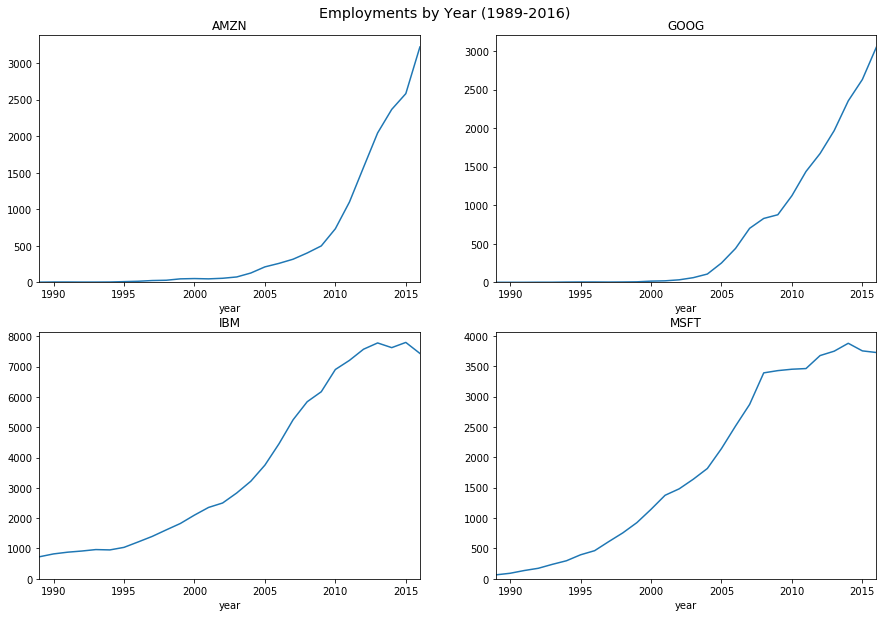

In [13]:
# count_by_years = pd.DataFrame({'count':empl_changes_df.groupby(['ticker','type','year']).size()}).reset_index()
# empl_by_years = count_by_years.groupby(['ticker','type']).apply(
#     lambda df:df.sort_values(['year']).assign(cumsum = lambda df2:df2['count'].cumsum()) # Calculate cumsum.
# ).reset_index(drop=True).pivot_table(
#     index=['ticker','year'],columns='type',values=['cumsum'],fill_value=0 # Reshape to wide format.
# ).assign(
#     employment=lambda df:(df['cumsum']['hiring']-df['cumsum']['firing']-df['cumsum']['leaving']) # Get employment.
# ).drop('cumsum',axis=1).reset_index()
# empl_by_years.columns = empl_by_years.columns.droplevel('type')

# Plot.
fig, axs = plt.subplots(2,2,figsize=(15,10))
fig.suptitle("Employments by Year (1989-2016)", fontsize="x-large",y=0.92)
for (ticker, col), ax in zip(
    empl_by_years.pivot_table(
        index='year',columns='ticker',values='employment',fill_value=0
    ).loc[lambda df:(df.index>=1989)&(df.index<=2016)].iteritems(),
    itertools.chain.from_iterable(axs)
):
    col.plot(ax=ax, title=ticker).set_ylim(bottom=0)
plt.show()

## Overall trends.
Note: Plots by year and plots by months do not only differ in frequency, but also in sample size. This is due to the entries without valid month record.

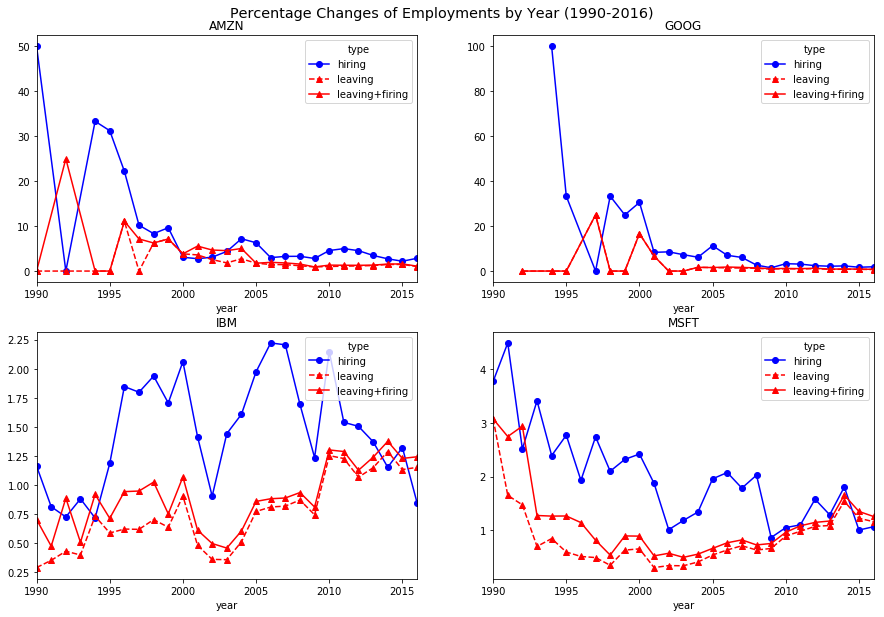

In [14]:
# Count and calculate percentages of employment changes.
prop_by_months = pd.DataFrame(
    {'count':empl_changes_df.groupby(['ticker','type','year','month']).size()} # Count by month.
).reset_index().merge(
    right=empl_by_years.assign(year_1L=lambda df:df.year+1)[['ticker','year_1L','employment']],
    left_on = ['ticker','year'], right_on = ['ticker','year_1L'] # Merge with last year's employment.
).assign(
    prop=lambda df:df['count']/df['employment']*100 # Calculate proportions.
).drop(
    ['count','year_1L','employment'],axis=1 # Drop unnecessary variables.
).loc[lambda df:(df.year>=1990)&(df.year<=2016)] # Keep only [1990, 2016] segment.

# Plot by year.
fig, axs = plt.subplots(2,2,figsize=(15,10))
fig.suptitle("Percentage Changes of Employments by Year (1990-2016)", fontsize="x-large",y=0.92)
for (ticker, grp), ax in zip(
    prop_by_months.pivot_table(
        index = ['ticker','year'], columns = 'type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{"leaving+firing":lambda df:df.leaving+df.firing}
    ).drop("firing",axis=1).groupby('ticker'),
    itertools.chain.from_iterable(axs)
):
    grp.drop('ticker',axis=1).loc[lambda df:df.year>=1990].set_index('year').plot(
        ax=ax, title=ticker, xticks=[1990,1995,2000,2005,2010,2015], xlim=(1990,2016), style=['b-o','r--^','r-^']
    )
plt.show()

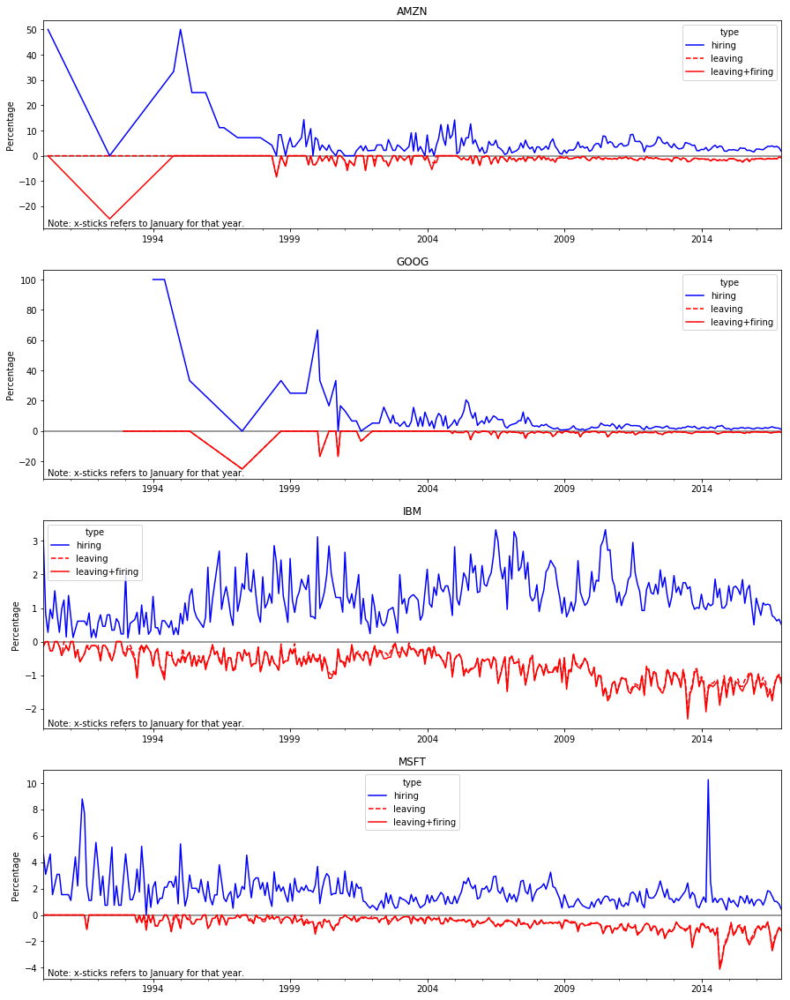

In [15]:
start_year=1990
end_year=2016
fig, axs = plt.subplots(4,1,figsize=(15,20))
for (ticker, grp),ax in zip(
    prop_by_months.loc[lambda df:(df.month!=0)&(df.year>=start_year)&(df.year<=end_year)].pivot_table(
        index = ['ticker','year','month'], columns='type', values = 'prop', fill_value=0
    ).reset_index().assign(
        **{
            "leaving+firing":lambda df:-(df.leaving+df.firing),
            "leaving":lambda df:-df.leaving,
            "yrmth":lambda df:pd.PeriodIndex(year=df.year,month=df.month,freq='M')
        }
    ).set_index('yrmth').groupby('ticker'),
    axs
):
    grp.loc[lambda df:df.year>=1990][['hiring','leaving','leaving+firing']].plot(
        ax=ax,title=ticker,style=['b-','r--','r-'],
        xlim=(pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016))),
        #xticks=[pd.Period('{}-01'.format(int(x*5+1990))) for x in range(5)]
    )
    ax.set_ylabel('Percentage')
    ax.set_xlabel('')
    ax.hlines(0,pd.Period('{}-01'.format(1990)),pd.Period('{}-12'.format(2016)),colors='tab:gray')
    ax.annotate("Note: x-sticks refers to January for that year.",(5,3),xycoords="axes points")
plt.show()

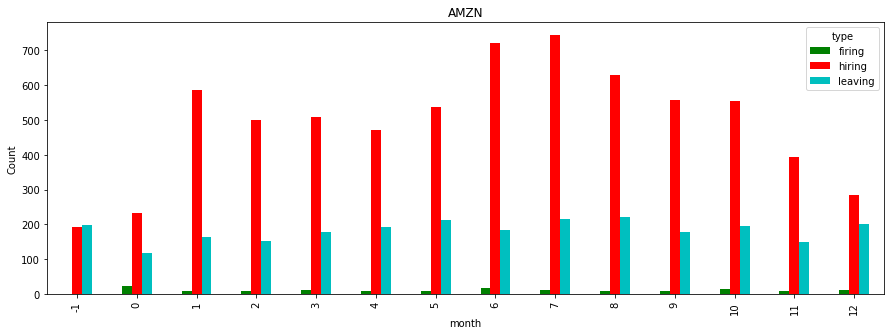

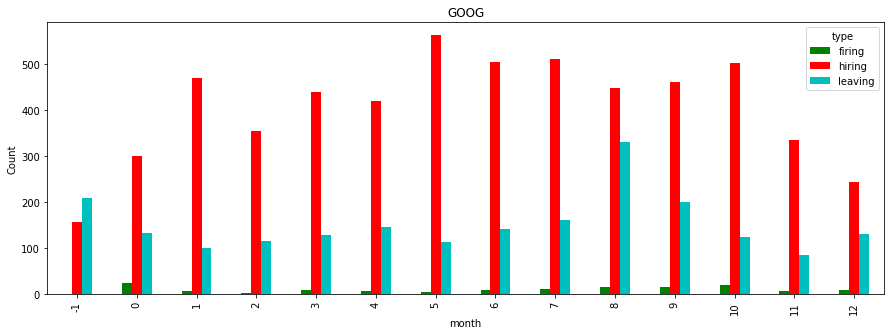

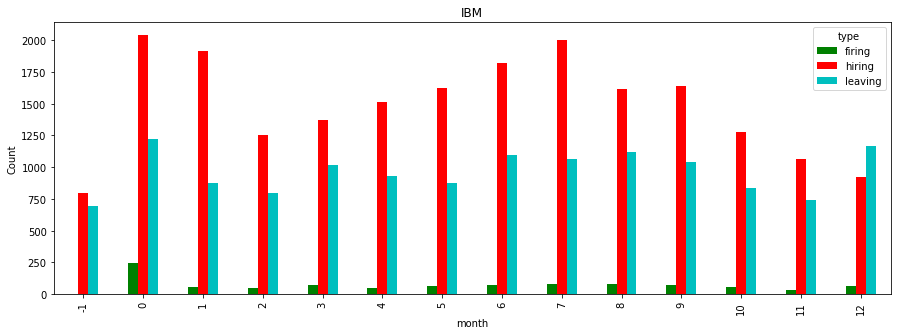

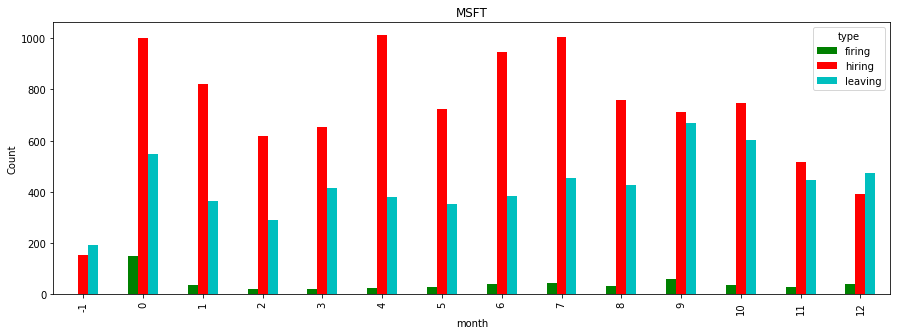

In [16]:
# Month composition.
display(HTML("<center><strong>Month Composition (-1: None, 0: Invalid month)</strong></center>"))
for idx, grp in empl_changes_df.groupby(['ticker']):
    grp.assign(count=1).pivot_table(
        index = 'month', columns = 'type', values='count', aggfunc='sum', fill_value=0
    ).plot.bar(figsize=(15,5),color=color_styles,title=idx).set_ylabel("Count")
    plt.show()

## By birth group.
Note: Birth year `2000` seems to be a trash bin for problematic records and thus will be treated the same as `None`.

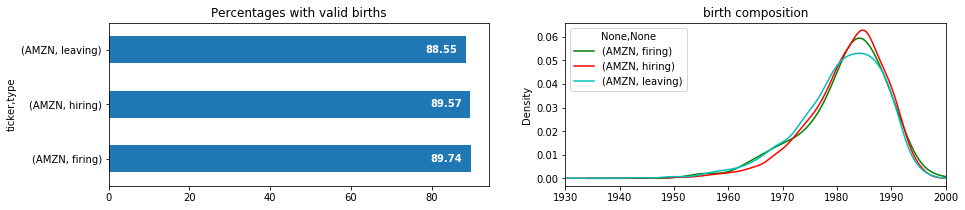

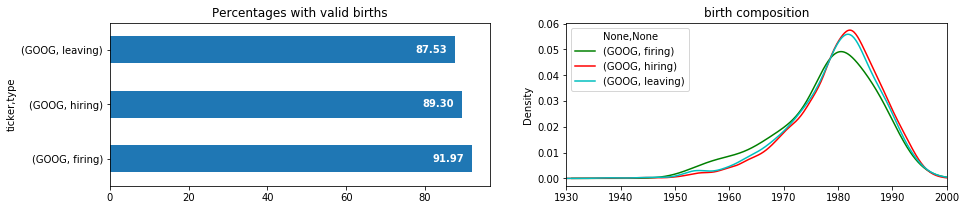

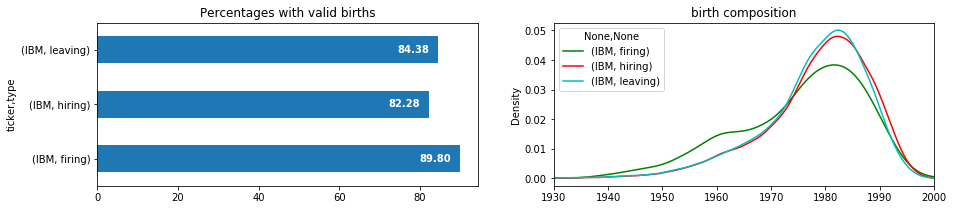

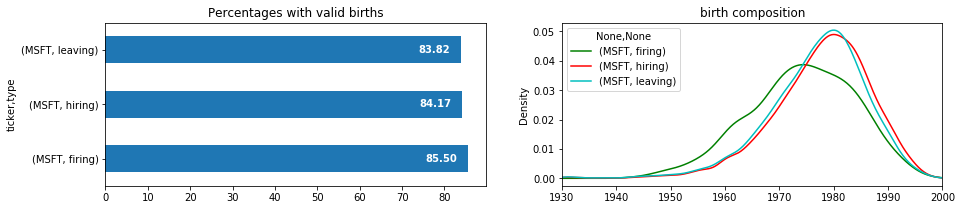

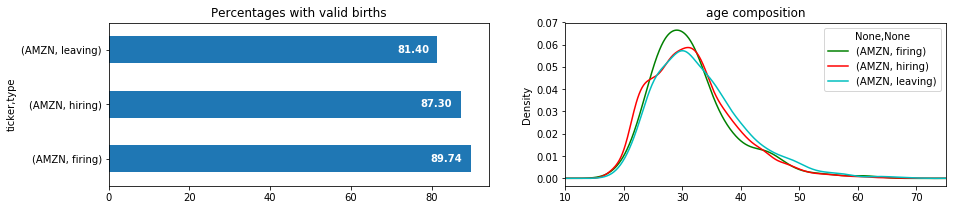

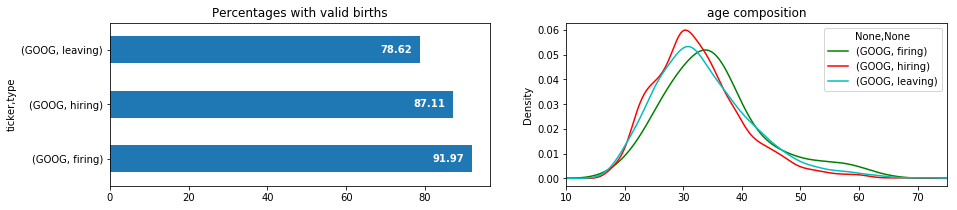

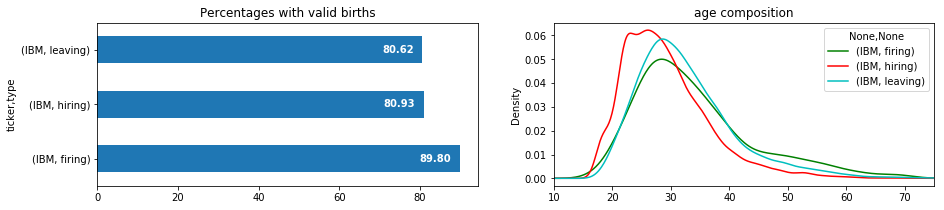

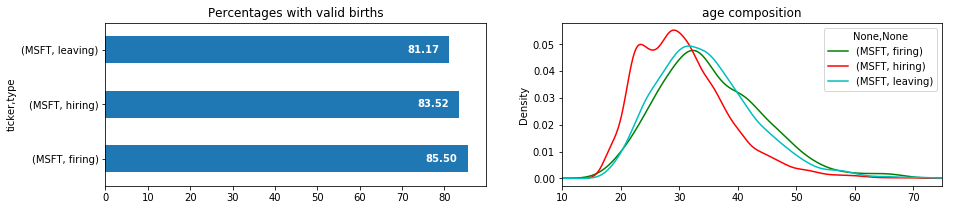

In [17]:
birth_df = empl_changes_df[['ticker','type','year','birth']]
birth_df = birth_df.assign(
    birth = lambda df:df.birth.apply(lambda x:int(x) if x not in ['2000','None'] else np.nan),
    age = lambda df:(df.year-df.birth)
)

# Define a routine to generate plots.
var, xlim = "birth", (1930,2000)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()
var, xlim = "age", (10,75)
for ticker, grp in birth_df.groupby('ticker'):
    plt.subplots(1,2,figsize=(15,3))
    plt.subplot(121)
    to_plot = grp.groupby(['ticker','type']).apply(lambda df:(df.loc[~df[var].isnull()].size/df.size*100))
    ax = to_plot.plot.barh(title="Percentages with valid births")
    for idx, value in enumerate(to_plot):
        ax.text(value-10,idx-0.05,'{:.2f}'.format(value),color='white',fontweight='bold')
    plt.subplot(122)
    for (idx, group), color in zip(grp.loc[~grp[var].isnull()].groupby(['ticker','type']),color_styles):
        group[var].plot.kde(xlim=xlim,label=idx,title="{} composition".format(var),color=color,legend=True)
    plt.show()

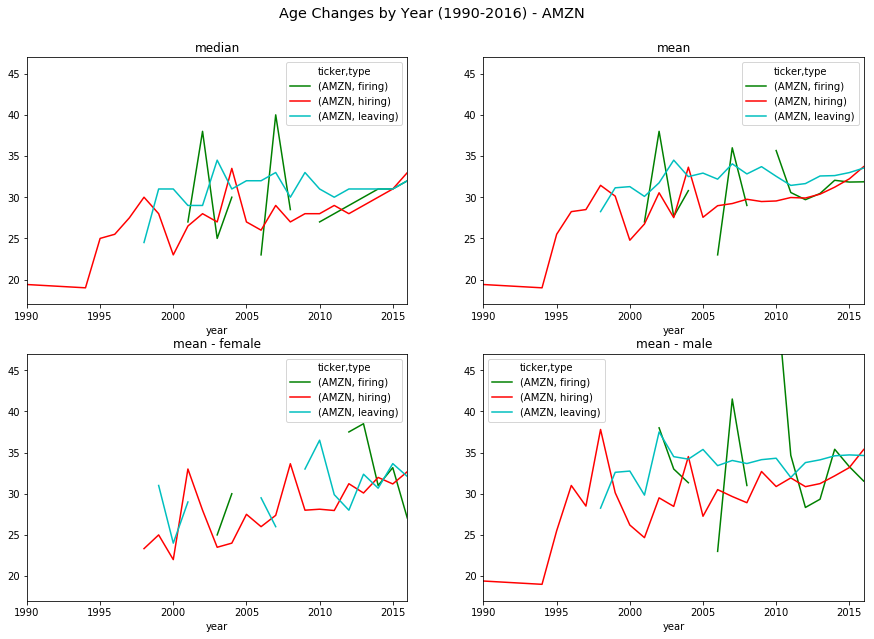

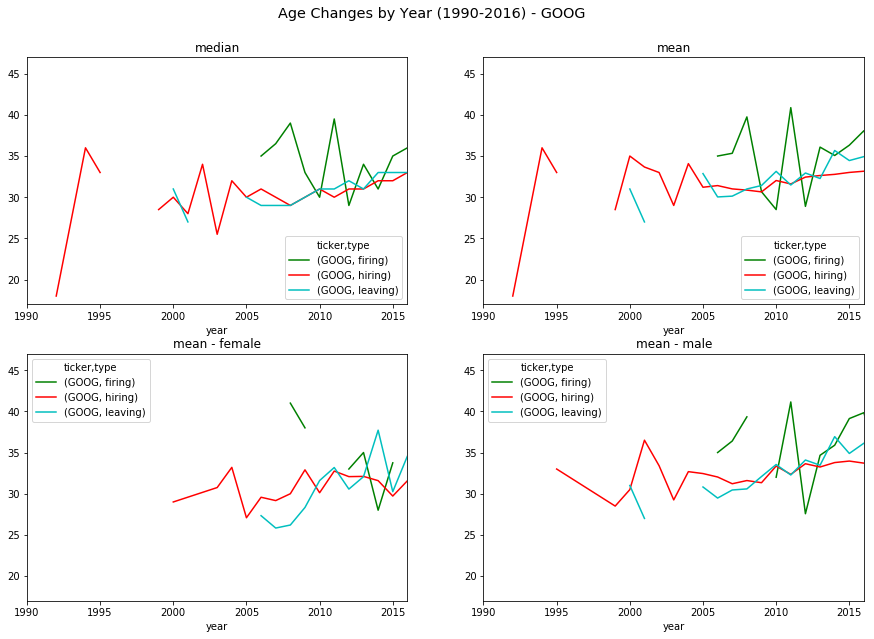

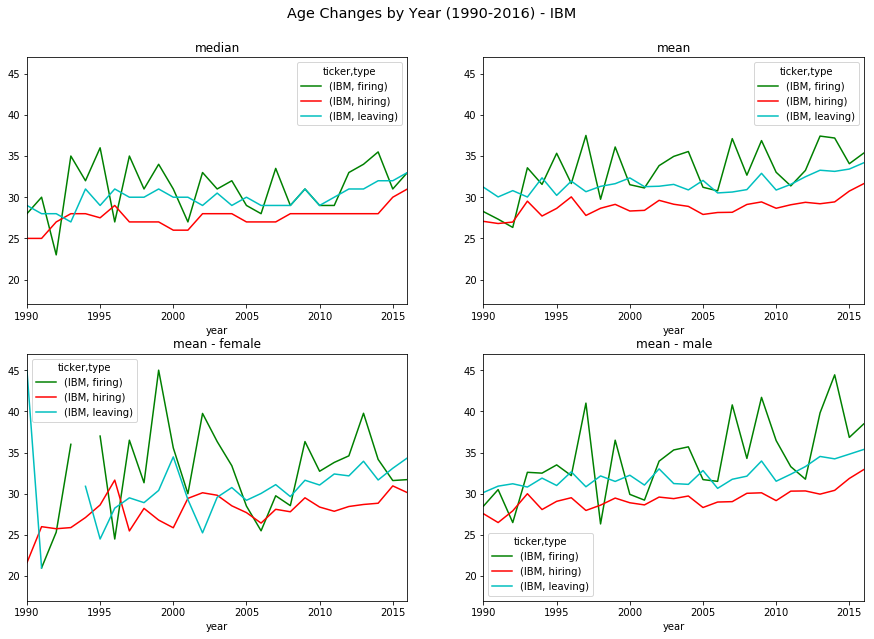

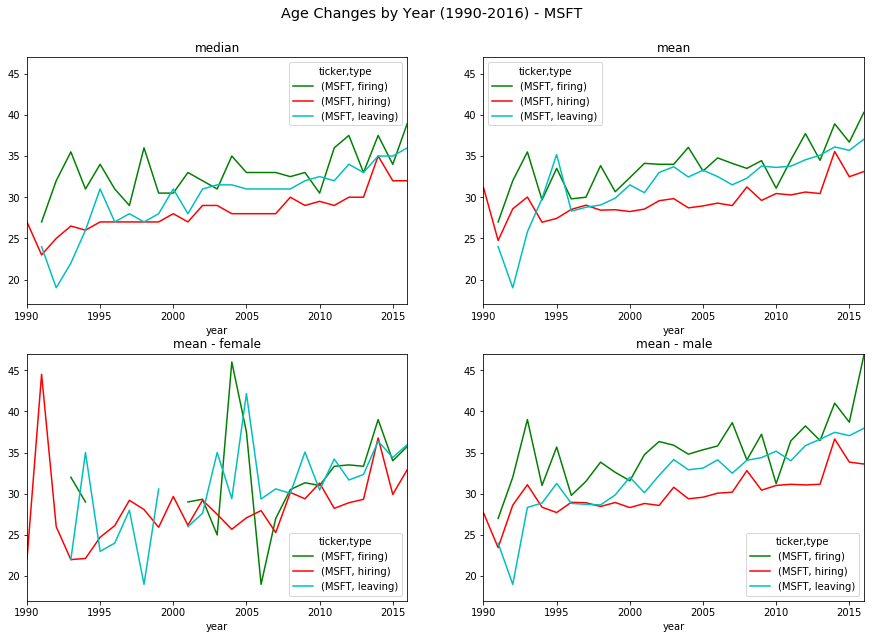

In [18]:
# Age changes by year.
for (ticker, grp) in birth_df.groupby('ticker'):
    fig, ((ax11, ax12), (ax21, ax22))=plt.subplots(2,2,figsize=(15,10))
    fig.suptitle('Age Changes by Year (1990-2016) - {}'.format(ticker),fontsize='x-large',y=0.95)
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='median'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax11,title='median')
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax12,title='mean')
    grp.loc[empl_changes_df.gender=='1'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax21,title='mean - female')
    grp.loc[empl_changes_df.gender=='2'].pivot_table(
        index='year',columns=['ticker','type'],values='age',aggfunc='mean'
    ).plot(xlim=(1990,2016),ylim=(17,47),color=color_styles,ax=ax22,title='mean - male')
    plt.show()

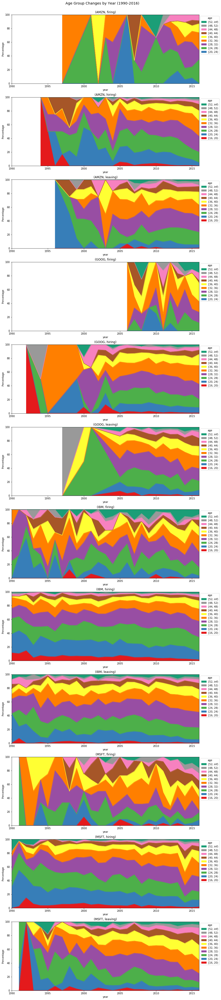

In [19]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age Group Changes by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=pd.cut(grp.age, bins, right=False, labels=False), values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""),xlim=(1990,2016),
        color=[colormap_unif[int(float(i))] for i in to_plot.columns],
        xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title='age'
    )
plt.show()

## By Gender.

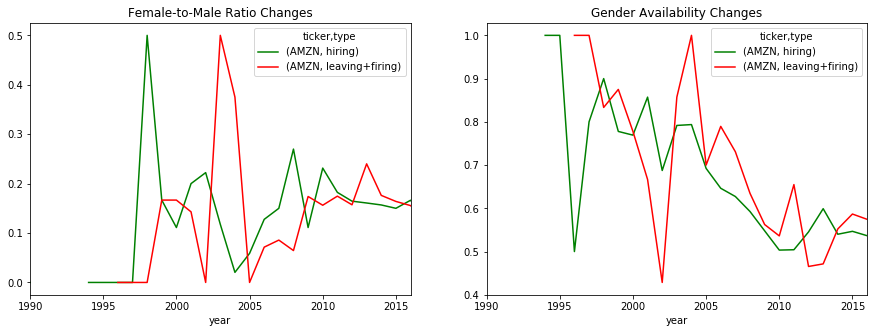

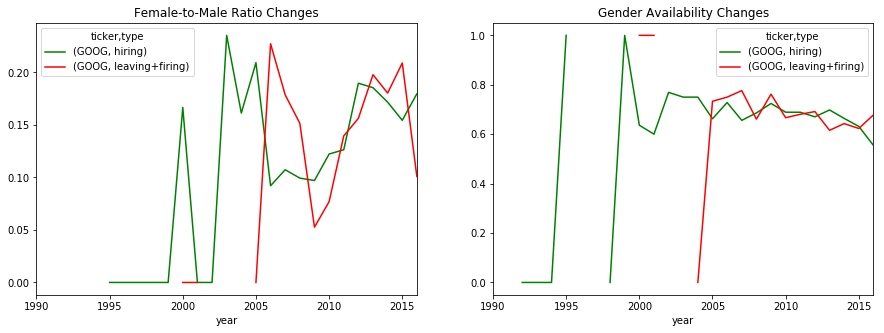

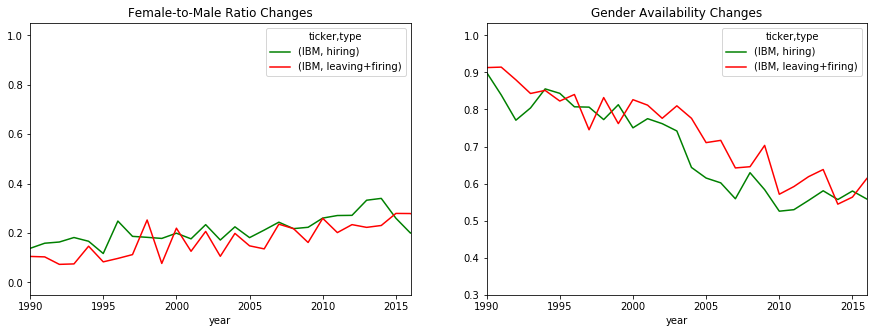

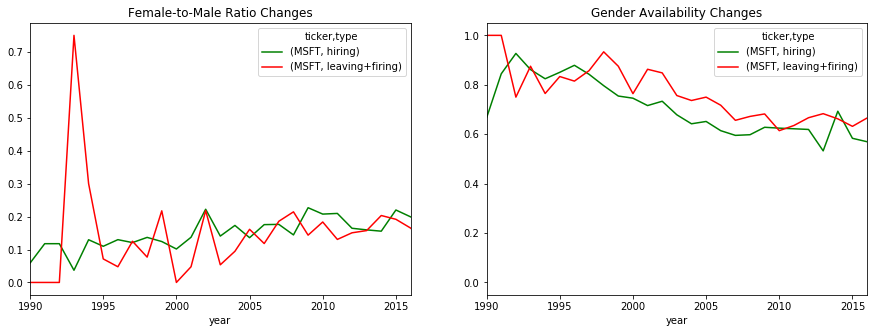

In [20]:
for ticker, grp in empl_changes_df.replace(
        to_replace={"type":{"firing":"leaving+firing","leaving":"leaving+firing"}}
).groupby('ticker'):
    fig, (ax1, ax2)=plt.subplots(1,2,figsize=(15,5))
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x=='1').sum()/(x=='2').sum() if (x=='2').sum() else np.nan)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Female-to-Male Ratio Changes",ax=ax1,
        xticks=[1990+5*x for x in range(6)]
    )
    grp.pivot_table(
        index='year',columns=['ticker','type'],values='gender',
        aggfunc=lambda x:((x!='0').sum()/x.size)
    ).plot(
        xlim=(1990,2016),color=color_styles,title="Gender Availability Changes",ax=ax2,
        xticks=[1990+5*x for x in range(6)]
    )
    plt.show()

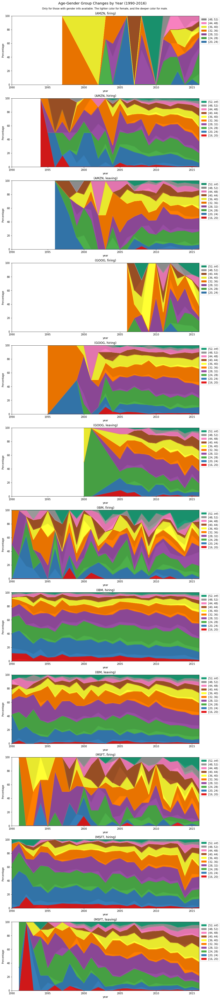

In [21]:
# Age group changes by year.
f_none_hidden = False # Whether to hide the ones out of [16, 52)
bins = list(np.arange(16,55,4))
colormap_unif = list(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)[:len(bins)-1]
if not f_none_hidden:
    bins = [0]+bins+[np.inf]
    colormap_unif = [plt.get_cmap('Dark2').colors[0]]+colormap_unif+[plt.get_cmap('Dark2').colors[0]]

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Age-Gender Group Changes by Year (1990-2016)", fontsize='x-large', y=0.891)
fig.text(0.25,0.885,
         "Only for those with gender info available. The lighter color for female, and the deeper color for male.")
for (idx, grp), ax in zip(
    birth_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(empl_changes_df.gender!='0'), ['ticker','type','year','age']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        index='year', columns=[pd.cut(grp.age, bins, right=False, labels=False), empl_changes_df.gender], 
        values='count', aggfunc='sum', fill_value=0
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990+5*x for x in range(6)],
        color=[
            colormap_unif[int(float(i))] if j=='1' else tuple(t/1.1 for t in colormap_unif[int(float(i))]) 
            for i,j in to_plot.columns
        ]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed([handles[i] for i in range(len(handles)) if i%2==0]), 
        reversed(["[{}, {})".format(bins[int(float(x))], bins[int(float(x))+1]) for x in
            [re.match(r"\((\d+)\.0",labels[i]).group(1) for i in range(len(labels)) if i%2==0]
        ]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Secondary Skill.

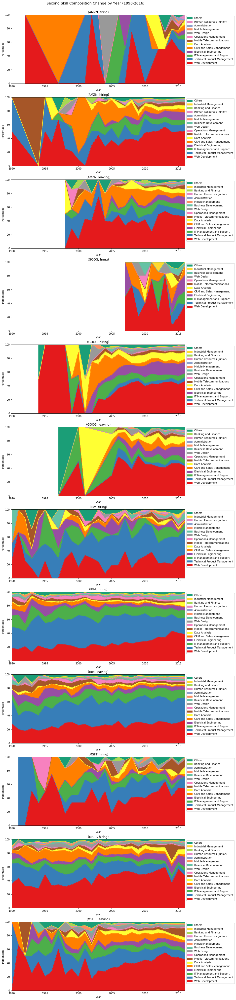

In [22]:
skill2_to_plot = empl_changes_df.loc[lambda df:df.skill2!='']

# Create a uniform colormap for all subplots.
skill2_ord_unif = skill2_to_plot.groupby('skill2').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    skill2_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# fig.suptitle("Secondary Skill Composition",fontsize='x-large')
# for (idx,col),ax in zip(
#     skill2_to_plot.loc[:].pivot_table(
#         index='skill2',columns=['ticker','type'],values='gender',aggfunc='count'
#     ).iteritems(), itertools.chain.from_iterable(axs)
# ):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:18]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     ax=to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,
#         colors = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(12.5,72))
fig.suptitle("Second Skill Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    skill2_to_plot.loc[lambda df:df.skill2!=''].loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','skill2']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        skill2_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(skill2_ord_unif)}[x] for x in df.skill2
        ], count = 1
    ).pivot_table(
        index='year', columns='skill2_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [skill2_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""), 
        xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(['\n'.join(wrap(x,30)) for x in labels]), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

In [23]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}

# Find representative profiles.
for i in range(5):
    display(HTML("<strong>"+skill2_ord_unif[i]+"</strong>"))
    to_plot = skill2_to_plot.assign(edu=lambda df:df.edu.apply(lambda x:edu_lablst[int(x)])).loc[
        lambda df:(df.skill2==skill2_ord_unif[i]),
        ["job_role","depmt","edu","f_elite"]
    ]
    N = to_plot.shape[0]
    # Job role.
    varname = "job_role"
    top10_job_role = pd.DataFrame([v
        for w in to_plot.groupby(varname).size().reset_index().apply(
        lambda x:[[x[varname].split(',')[0].title(),x[0]]]
        #lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N*100).apply(round,ndigits=2)
    ).reset_index(drop=True)#.drop("count",axis=1)
    # Department.
    varname = "depmt"
    to_plot_depmt = to_plot.loc[lambda df:df[varname]!='']
    N_depmt = to_plot_depmt.shape[0]
    top10_depmt = pd.DataFrame([v
        for w in to_plot_depmt.groupby(varname).size().reset_index().apply(
        lambda x:[[y.title(),z] for y in x[varname].split(',') for z in [x[0]/(x[varname].count(',')+1)]]
        ,axis=1) for v in w
    ],columns=[varname,"count"]).replace(
        {varname:{"Tehnology":"Technology"}}
    ).groupby(varname).sum().reset_index().sort_values(
        "count",ascending=False
    ).head(10).assign(
        prop=lambda df:(df["count"]/N_depmt*100).apply(round,ndigits=2)
    ).reset_index(drop=True).drop("count",axis=1)
    # Education.
    top10_edu = to_plot.groupby("edu").size().sort_values(ascending=False).apply(
        lambda x:round(x/N*100,2)).rename("prop").reset_index()
    # show.
    display(HTML("<em>Top 10 entries for each variables with proportions:</em>"))
    display(pd.concat([top10_job_role,top10_depmt,top10_edu], axis=1))
    # Some examples.
    to_plot = to_plot.sample(30).assign(
        job_role=lambda df:df.job_role.apply(lambda x:x.split(",")[0])
    )
    display(HTML("<em>Some examples:</em>"))
    display(to_plot)
    

,job_role,count,prop,depmt,prop,edu,prop
0,Software Engineer,2664,14.39,Technology,84.82,Bachelors,49.10
1,Software Development Engineer,1825,9.86,Marketing,6.33,Masters excl. MBA,28.39
2,Senior Software Engineer,564,3.05,Production,2.67,None/Unknown,14.61
3,Software Developer,553,2.99,Oversight,1.95,Doctorate (PhD/JD/MD),4.58
4,Application Developer,297,1.60,Business,1.48,MBA,1.63
5,Software Development Engineer In Test,259,1.40,Operations,1.17,High school,1.15
6,Sdet,253,1.37,Hr,0.83,Associates,0.30
7,Software Development Engineer Ii,231,1.25,Legal,0.63,Vocational degree,0.24
8,Software Design Engineer,225,1.22,Accounting,0.08,NaN,NaN
9,Sde,221,1.19,Management,0.04,NaN,NaN


,job_role,depmt,edu,f_elite
65764,Senior Software Engineer,TECHNOLOGY,Bachelors,False
53805,Program Manager,,Bachelors,False
3064,Software Engineer,TECHNOLOGY,Bachelors,True
32525,Software Engineer,TECHNOLOGY,Bachelors,False
9628,Technical Specialist,,Masters excl. MBA,True
68169,Senior SDET Lead,,Bachelors,False
49097,Senior Consultant,,Bachelors,False
63966,Senior Software Development Engineer,TECHNOLOGY,None/Unknown,False
68530,Software Engineer,TECHNOLOGY,Bachelors,False
61669,Software Development Engineer in Test Microsof...,TECHNOLOGY,Bachelors,True


,job_role,count,prop,depmt,prop,edu,prop
0,Software Engineer,644,5.78,Technology,72.74,Bachelors,47.94
1,It Specialist,319,2.86,Marketing,8.69,Masters excl. MBA,21.52
2,Senior Software Engineer,246,2.21,Production,6.76,None/Unknown,21.34
3,Application Developer,176,1.58,Business,3.40,MBA,3.85
4,Software Developer,157,1.41,Operations,2.81,Doctorate (PhD/JD/MD),3.02
5,System Engineer,146,1.31,Hr,2.46,High school,1.50
6,Software Test Engineer,119,1.07,Oversight,1.64,Associates,0.48
7,It Architect,114,1.02,Legal,0.91,Vocational degree,0.36
8,Advisory Software Engineer,113,1.01,Accounting,0.54,NaN,NaN
9,Staff Software Engineer,105,0.94,Management,0.06,NaN,NaN


,job_role,depmt,edu,f_elite
33487,WebSphere Commerce Integration Architect,TECHNOLOGY,Bachelors,False
50159,IT Contractor,TECHNOLOGY,Bachelors,False
25029,IT Specialist,TECHNOLOGY,None/Unknown,False
37441,Agile Teacher and Coach,,Masters excl. MBA,False
6434,Specialist Solutions Architect - Big Data & An...,BUSINESS,Masters excl. MBA,False
47901,Customer Support Specialist,MARKETING,Bachelors,False
47364,test automation engineer,TEHNOLOGY,Masters excl. MBA,False
35980,Delivery Manager,OPERATIONS,Bachelors,False
55506,Senior Software Engineering (Test) Manager,TECHNOLOGY,None/Unknown,False
30216,Senior Consultant,,Masters excl. MBA,False


,job_role,count,prop,depmt,prop,edu,prop
0,Software Engineer,428,8.87,Technology,68.32,Bachelors,45.92
1,Software Development Engineer,108,2.24,Marketing,12.69,None/Unknown,23.04
2,It Specialist,102,2.11,Production,6.95,Masters excl. MBA,20.68
3,Senior Software Engineer,86,1.78,Operations,6.86,Doctorate (PhD/JD/MD),4.70
4,Staff Software Engineer,75,1.55,Business,1.91,High school,1.80
5,Advisory Software Engineer,63,1.31,Oversight,1.53,Associates,1.80
6,Systems Engineer,54,1.12,Hr,1.41,MBA,1.76
7,Site Reliability Engineer,53,1.10,Legal,0.19,Vocational degree,0.29
8,Software Developer,45,0.93,Accounting,0.10,NaN,NaN
9,Software Test Engineer,44,0.91,Management,0.02,NaN,NaN


,job_role,depmt,edu,f_elite
22984,BCRS department /Backup & Recovery Specialist,,Bachelors,False
35408,Customer Engineer (Field Service),MARKETING,Bachelors,False
22703,IT specialist - 1st level,TECHNOLOGY,Bachelors,False
26524,Manager IBM High Performance Computing workloa...,,Masters excl. MBA,False
42902,Development Engineer and Project Manager,,Bachelors,False
57330,Lead Systems Engineer,TECHNOLOGY,None/Unknown,False
30625,Computer Engineer,,Bachelors,False
3680,Linux System Administrator,,None/Unknown,False
34325,Technical Support Specialist,MARKETING,Bachelors,False
68584,Principal MCS,,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Software Engineer,761,21.02,Technology,87.59,Bachelors,36.67
1,Software Development Engineer,300,8.29,Marketing,4.23,Masters excl. MBA,31.54
2,Senior Software Engineer,130,3.59,Production,2.76,Doctorate (PhD/JD/MD),18.75
3,Software Developer,54,1.49,Oversight,1.81,None/Unknown,11.10
4,Staff Software Engineer,41,1.13,Operations,1.40,MBA,0.91
5,Sde,39,1.08,Legal,1.23,High school,0.83
6,Engineer,36,0.99,Business,0.74,Associates,0.14
7,Associate System Engineer,35,0.97,Hr,0.21,Vocational degree,0.06
8,Software Development Engineer Ii,35,0.97,Accounting,0.02,NaN,NaN
9,Program Manager,34,0.94,NaN,NaN,NaN,NaN


,job_role,depmt,edu,f_elite
50849,Infrastructure Technical Consultant : Storage ...,HR,Masters excl. MBA,True
48383,Firmware Developer (Contract),LEGAL,Bachelors,False
41849,Software Engineer,TECHNOLOGY,Bachelors,False
44048,Advisory software Engineer (Tech Lead/Project ...,TECHNOLOGY,Bachelors,False
68857,Software Development Engineer,TECHNOLOGY,None/Unknown,False
40773,Sr Engineer,,Bachelors,False
61840,Senior Architect Director of Windows Build,OVERSIGHT,Bachelors,True
8059,DevOps Engineer,,Doctorate (PhD/JD/MD),False
65327,SDE - II,,Doctorate (PhD/JD/MD),False
68197,Software Development Engineer (Open GL team Wi...,TECHNOLOGY,Bachelors,False


,job_role,count,prop,depmt,prop,edu,prop
0,Software Engineer,153,6.69,Technology,67.41,Bachelors,43.70
1,Program Manager,59,2.58,Marketing,10.33,None/Unknown,22.57
2,Software Development Engineer,52,2.27,Oversight,8.48,Masters excl. MBA,17.02
3,Software Design Engineer,38,1.66,Business,5.54,MBA,9.19
4,Senior Software Engineer,36,1.57,Operations,2.78,Doctorate (PhD/JD/MD),6.43
5,Software Test Engineer,31,1.36,Hr,2.24,Associates,0.44
6,Product Manager,29,1.27,Production,2.14,High school,0.35
7,Senior Program Manager,28,1.22,Legal,0.51,Vocational degree,0.31
8,Staff Software Engineer,28,1.22,Accounting,0.42,NaN,NaN
9,Software Development Manager,27,1.18,Management,0.15,NaN,NaN


,job_role,depmt,edu,f_elite
64046,Software Test Engineer II,TECHNOLOGY,None/Unknown,False
67271,Sales Engineer,MARKETING,None/Unknown,False
10144,Software Engineer,TECHNOLOGY,Masters excl. MBA,False
35473,IT Architect,TECHNOLOGY,None/Unknown,False
20874,Senior Technical Manager (SW development (2nd ...,,MBA,False
48864,Development & QA Manager,PRODUCTION,Bachelors,False
34258,Software Engineer,TECHNOLOGY,None/Unknown,False
40491,Senior Engineering Manager,TECHNOLOGY,Bachelors,False
54699,SDE,,Doctorate (PhD/JD/MD),False
16056,Technical Lead Distribution (APAC),OPERATIONS,Masters excl. MBA,False


## By Country.

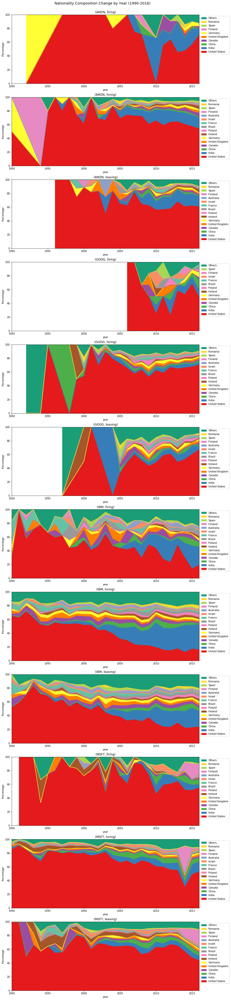

In [24]:
# Create a uniform colormap for all subplots.
cntry_ord_unif = empl_changes_df.groupby('cntry').size().sort_values(ascending=False).index.tolist()
colormap_unif = {idx:clr for idx, clr in zip(
    cntry_ord_unif,
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif['Others'] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='cntry',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     to_plot0 = col.sort_values(ascending=False)
#     to_plot = to_plot0.iloc[0:28]
#     to_plot.loc['Others']=to_plot0.sum()-to_plot.sum()  
#     to_plot.plot.pie(
#         ax=ax,labeldistance=1.05,title=str(idx).replace("'",''),autopct='%.2f',pctdistance=0.9,rotatelabels=True,
#         color = [colormap_unif[idx] for idx in to_plot.index]
#     )
#     ax.set_ylabel('')
# plt.show()


## Continued ##
N_cats = 15 # Number of categories to be shown.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Nationality Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','cntry']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.assign(
        cntry_id = lambda df:[
            {val:(idx if idx<N_cats else N_cats) for idx, val in enumerate(cntry_ord_unif)}[x] for x in df.cntry
        ], count = 1
    ).pivot_table(
        index='year', columns='cntry_id', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.columns = [cntry_ord_unif[i] if i<N_cats else "Others" for i in to_plot.columns]
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016),xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), reversed(labels), 
        loc='upper left',bbox_to_anchor=(1,1)
    )
plt.show()

## By Education Level.

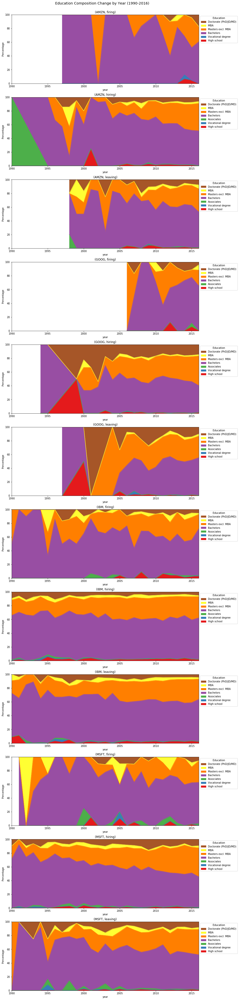

In [25]:
edu_lablst = {
    0:"None/Unknown", 1:"High school", 2:"Vocational degree", 3:"Associates", 
    4:"Bachelors", 5:"Masters excl. MBA", 6:"MBA", 7:"Doctorate (PhD/JD/MD)"
}
colormap_unif = {str(idx):clr for idx, clr in zip(
    range(len(edu_lablst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Codes for showing pie charts:
# fig,axs=plt.subplots(3,2,figsize=(15,22.5))
# for (idx,col),ax in zip(empl_changes_df.loc[:].pivot_table(
#     index='edu',columns=['ticker','type'],values='gender',aggfunc='count'
# ).iteritems(),itertools.chain.from_iterable(axs)):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[edu_lablst[x] for x in range(0,8)]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Education Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','edu']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.edu]].assign(count = 1).pivot_table(
        index='year', columns='edu', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'",""),
        xlim=(1990,2016), xticks=[1990+x*5 for x in range(6)]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [edu_lablst[int(x)] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Education"
    )
plt.show()



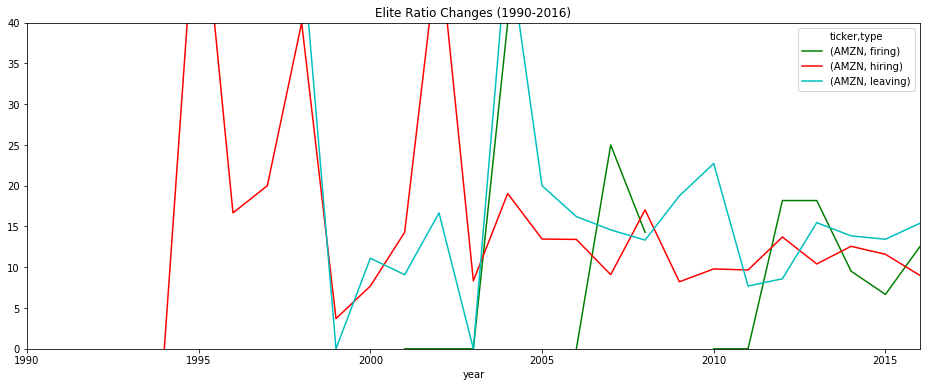

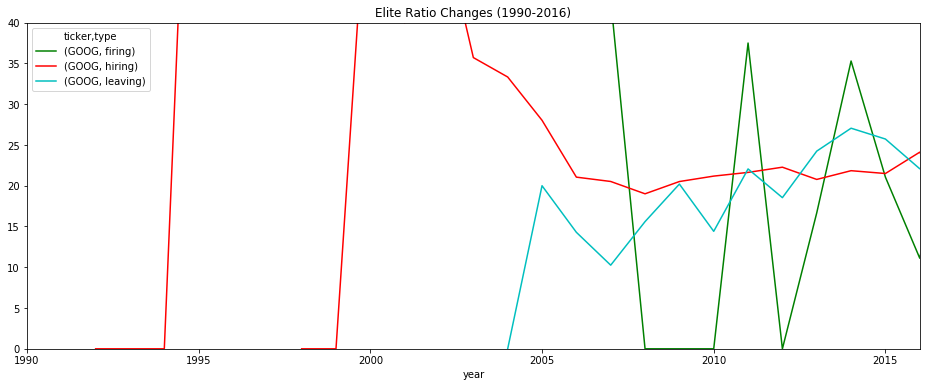

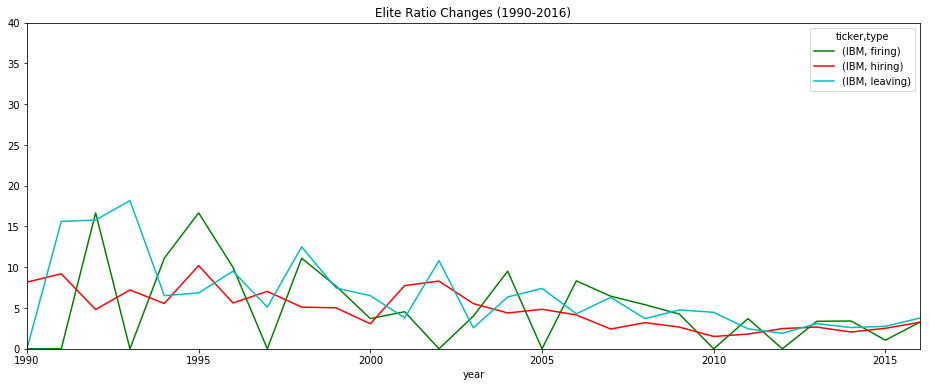

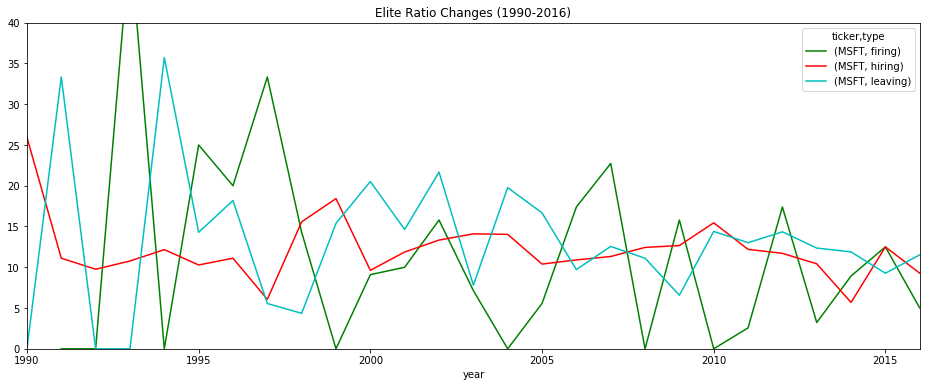

In [26]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    grp.loc[lambda df:df.year>=1990].pivot_table(
        index='year',columns=['ticker','type'],values='f_elite',
        aggfunc=lambda x:((x=='True').sum()/(x==x).sum()*100)
    ).plot(
        xlim=(1990,2016),color=color_styles,ylim=(0,40),
        title="Elite Ratio Changes (1990-2016)",figsize=(16,6)
    )
    ax.set_ylabel('Percentage')
plt.show()

# By Next Industry.

Note: Division of 2-digit NAICS's into industry groups are obtained from [Bureau of Labor Statistics](https://www.bls.gov/iag/tgs/iag_index_naics.htm).

In [27]:
NAICS2GRP_dict = {
    '11': (1, "Natural Resources and Mining"),
    '21': (1, "Natural Resources and Mining"),
    '23': (2, "Construction"),
    '31': (3, "Manufacturing"),
    '32': (3, "Manufacturing"),
    '33': (3, "Manufacturing"),
    '42': (4, "Trade, Transportation, and Utilities"),
    '44': (4, "Trade, Transportation, and Utilities"),
    '45': (4, "Trade, Transportation, and Utilities"),
    '48': (4, "Trade, Transportation, and Utilities"),
    '49': (4, "Trade, Transportation, and Utilities"),
    '22': (4, "Trade, Transportation, and Utilities"),
    '51': (5, "Information"),
    '52': (6, "Financial Activities"),
    '53': (6, "Financial Activities"),
    '54': (7, "Professional and Business Services"),
    '55': (7, "Professional and Business Services"),
    '56': (7, "Professional and Business Services"),
    '61': (8, "Education and Health Services"),
    '62': (8, "Education and Health Services"),
    '71': (9, "Leisure and Hospitality"),
    '72': (9, "Leisure and Hospitality"),
    '81': (10, "Other Services"),
    '92': (11, "Public Administration"),
    '99': (12, "Unknown/Unclassified"),
    ''  : (12, "Unknown/Unclassified"),
    'MI': (12, "Unknown/Unclassified"),
    '46': (12, "Unknown/Unclassified")
}

# Show the mappings.
pd.DataFrame(
    [[key, value[0], value[1]] for key,value in NAICS2GRP_dict.items()]
).groupby([1,2])[0].apply(lambda ser:', '.join(ser)).reset_index().drop(1,axis=1).rename(
    {2:"Industry group",0:"NAICS2"},axis=1
)

,Industry group,NAICS2
0,Natural Resources and Mining,"11, 21"
1,Construction,23
2,Manufacturing,"31, 32, 33"
3,"Trade, Transportation, and Utilities","42, 44, 45, 48, 49, 22"
4,Information,51
5,Financial Activities,"52, 53"
6,Professional and Business Services,"54, 55, 56"
7,Education and Health Services,"61, 62"
8,Leisure and Hospitality,"71, 72"
9,Other Services,81


Note: `46` seems to be a wrong NAICS2 code.

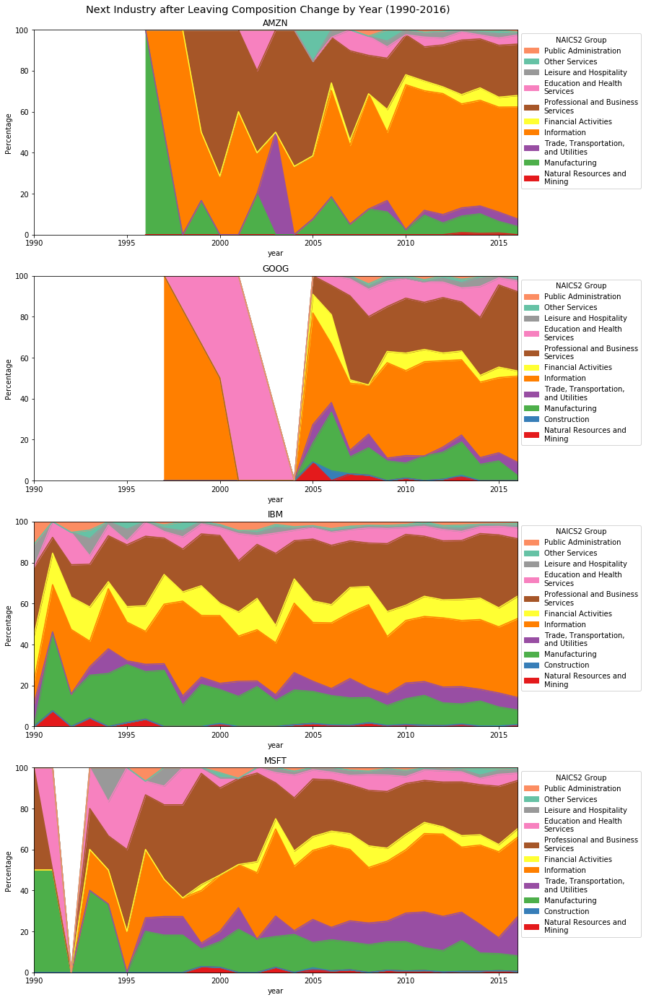

In [28]:
ind_next_lst = sorted(list(set(NAICS2GRP_dict.values())))
colormap_unif = {idx:clr for idx, clr in zip(
    ind_next_lst[:-1], # Assume the last element is "Others".
    itertools.cycle(plt.get_cmap('Set1').colors+plt.get_cmap('Set2').colors+plt.get_cmap('Set3').colors)
)}
colormap_unif[ind_next_lst[-1]] = plt.get_cmap('Dark2').colors[0]

# Codes for showing pie charts:
# fig,axs=plt.subplots(1,2,figsize=(15,7.5))
# for (idx,col),ax in zip(empl_changes_df.loc[lambda df:df.type=='leaving'].pivot_table(
#     index=empl_changes_df.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
#     columns='ticker', values='gender', aggfunc='count'
# ).iteritems(),axs):
#     col.plot.pie(
#         ax=ax, labeldistance=1.05, title=str(idx).replace("'",''), autopct='%.2f', pctdistance=0.9,
#         colors=[colormap_unif[idx] for idx in col.index], labels=[x[1] for x in col.index]
#     )
#     ax.set_ylabel('')
# plt.show()

## Continued ##
f_none_hidden = True # Whether to show the "None/Unknown"s.

# Plot composition changes by years.
fig, axs = plt.subplots(4,1,figsize=(12,24))
fig.suptitle("Next Industry after Leaving Composition Change by Year (1990-2016)", fontsize='x-large', y=0.90)
for (idx, grp), ax in zip(
    empl_changes_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016)&(df.type=='leaving'), ['ticker','type','year','ind_next']
    ].groupby('ticker'), axs
):
    to_plot = grp.assign(count=1).pivot_table(
        columns=grp.ind_next.apply(lambda x:NAICS2GRP_dict[x[:2]]),
        index='year', values='count', aggfunc='sum', fill_value=0
    )
    if f_none_hidden:
        to_plot.drop(ind_next_lst[-1], axis=1, inplace=True)
    to_plot = to_plot.apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[idx] for idx in to_plot.columns],
        ylim=(0,100), title=idx, xlim=(1990,2016), xticks=[1990,1995,2000,2005,2010,2015]
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), ["\n".join(wrap(re.match(r"\(\d+, (.+)\)",x).group(1),25)) for x in reversed(labels)], 
        loc='upper left', bbox_to_anchor=(1,1), title="NAICS2 Group"
    )
plt.show()

## Tenure and Number of Promotions.

Note:
- Tenure = End date of last entry - Start date of first entry in a consecutive sequence of entries in the same company;
 - When there is any invalid month in the two dates and their years are _not_ the same, the invalid month is replaced by 6;
 - When there is any invalid month in the two dates and their years are the same, the invalid month is assumed to be the extreme value (0 for start and 12 for end) and the results are the minimum of their difference and 6.
- Number of promotions = Number of entries in a consecutive sequence of entries in the same company - 1.

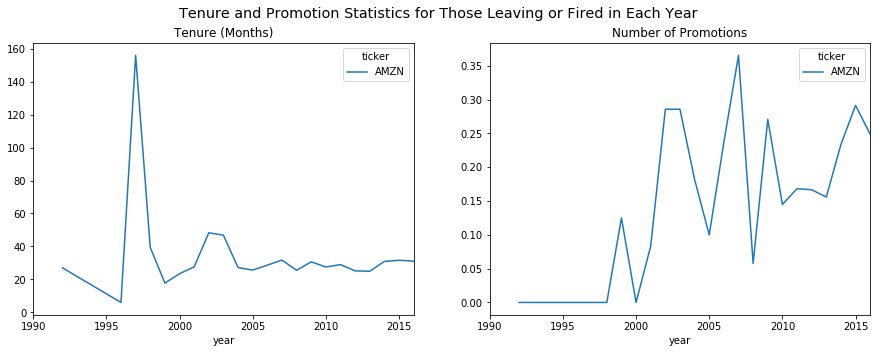

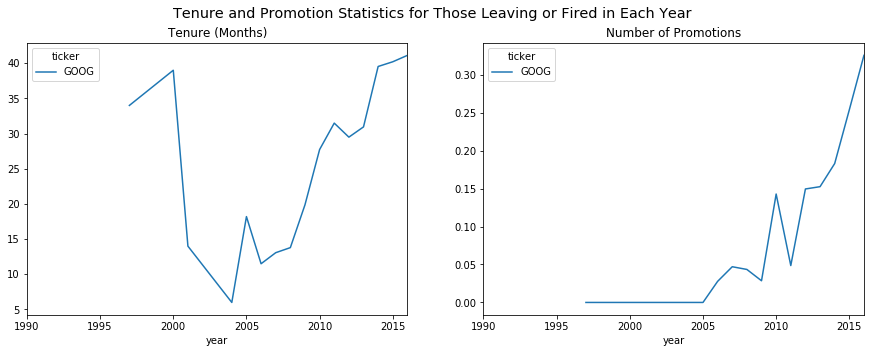

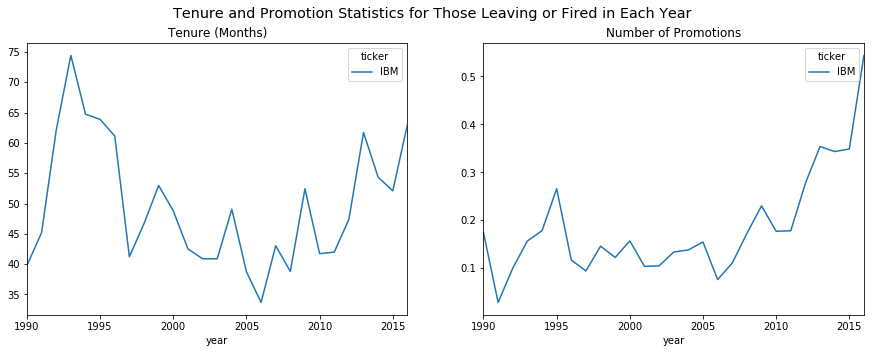

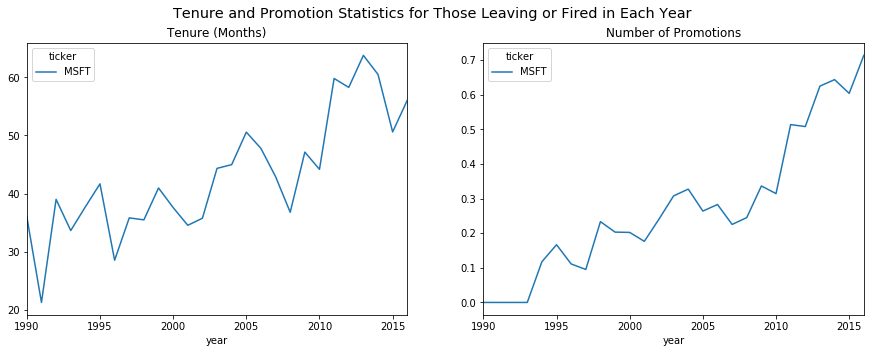

In [29]:
for ticker, grp in empl_changes_df.groupby('ticker'):
    # Calculate.
    to_plot = grp.loc[lambda df:(df.type!='hiring')&(df.year>=1990)&(df.year<=2016)].astype(
        {'tenure':'Int64','nprom':'Int64'}
    ).pivot_table(
        columns=['ticker'],index='year',values=['tenure','nprom'],aggfunc=np.nanmean
    )

    # Plot.
    fig, (ax1,ax2) = plt.subplots(1,2,figsize=(15,5))
    fig.suptitle("Tenure and Promotion Statistics for Those Leaving or Fired in Each Year",fontsize='x-large')
    to_plot['tenure'].plot(
        title="Tenure (Months)",ax=ax1,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
    to_plot['nprom'].plot(
        title="Number of Promotions",ax=ax2,xticks=[1990,1995,2000,2005,2010,2015],xlim=(1990,2016)
    )
plt.show()

# By Hierarchies for Top 1,000 Jobs.

In [30]:
# Read data.
job_titles_df = pd.read_excel(r"../job_titles/job_titles_checked.xlsx", sheet_name="Software Engineering")
job_titles_df = job_titles_df.loc[lambda df:df.senior0>0]
assert job_titles_df.job_title.is_unique
empl_job_titles_df = empl_changes_df.loc[lambda df:df.year>=1990].assign(
    job_title = lambda df:df.job_role.apply(lambda x:x.split(",")[0])
)[["type", "ticker", "year", "job_title"]]
empl_job_titles_df = empl_job_titles_df.merge(job_titles_df, on="job_title", how="left", indicator="mark")

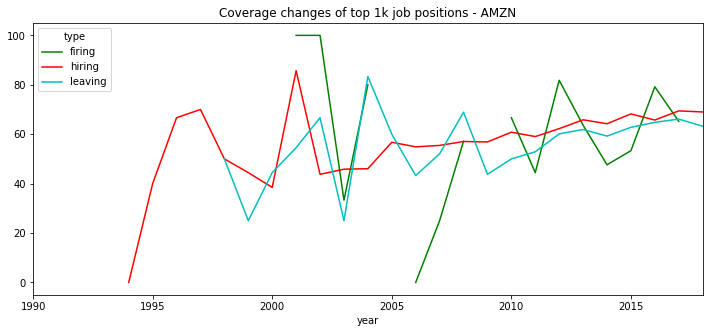

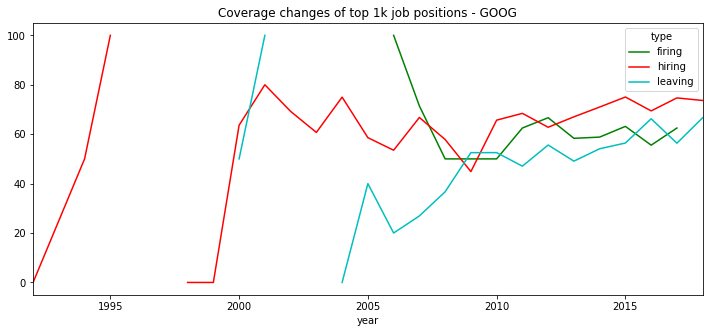

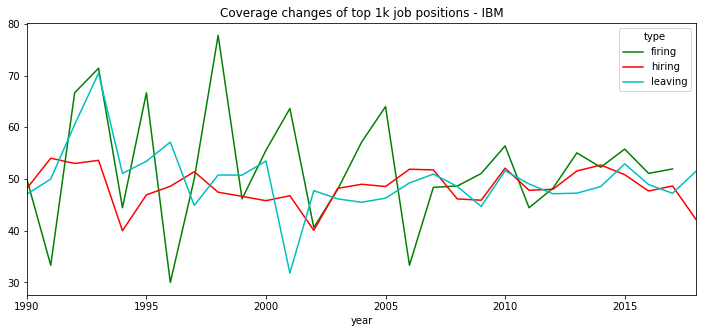

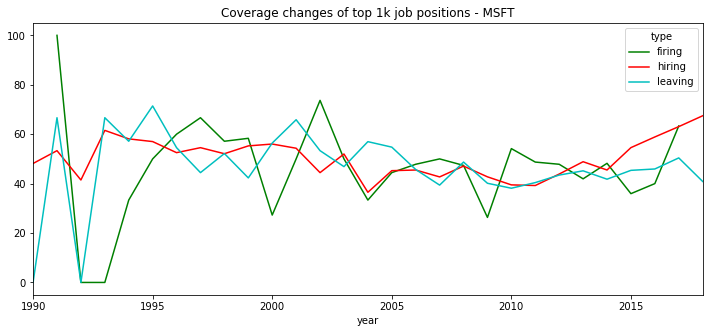

In [31]:
# Plot availability.
for idx, grp in empl_job_titles_df.groupby("ticker"):
    grp.groupby(["year", "type"])["mark"].apply(
        lambda ser:(ser=="both").sum()/len(ser)*100
    ).rename("prop").reset_index().pivot_table(index="year", columns=["type"], values="prop").plot(
        figsize=(12,5), title="Coverage changes of top 1k job positions - {}".format(idx),color=color_styles
    )
plt.show()

In [32]:
empl_top1k_jobs_df = empl_job_titles_df.loc[lambda df:df.mark=="both"]
senior_lst = {1:"Junior", 2:"Senior", 3:"Junior Mgmt.", 4:"Middle Mgmt.", 5:"Senior Mgmt."}

display(HTML("<strong>Top 10 Job Titles for Each Hierarchy</strong>"))
display(pd.concat([
    grp.assign(
        prop=lambda df1:round(100*df1["count"]/df1["count"].sum(),2)
    ).sort_values("count", ascending=False).head(10).reset_index(drop=True).drop("senior0", axis=1) 
    for idx, grp in 
        empl_top1k_jobs_df.groupby(["senior0","job_title"]).size().rename("count").reset_index().groupby("senior0")
], axis=1, keys=[senior_lst[x+1] for x in range(len(senior_lst))]))

Junior               \
                       job_title count   prop   
0              Software Engineer  7519  30.00   
1  Software Development Engineer  3850  15.36   
2             Software Developer  1200   4.79   
3          Application Developer   887   3.54   
4        Staff Software Engineer   777   3.10   
5         Software Test Engineer   643   2.57   
6                System Engineer   538   2.15   
7      Associate System Engineer   518   2.07   
8       Software Design Engineer   492   1.96   
9     Advisory Software Engineer   434   1.73   

                                 Senior               \
                              job_title count   prop   
0              Senior Software Engineer  1826  32.28   
1                Senior System Engineer   348   6.15   
2  Senior Software Development Engineer   340   6.01   
3                     Senior Consultant   222   3.93   
4             Senior Software Developer   183   3.24   
5                 Sr. Software Engineer   156   2.76   
6                      Systems Engineer   145   2.56   
7                       Senior Engineer   138   2.44   
8           Principal Software Engineer   134   2.37   
9                    Software Architect    98   1.73   

                   Junior Mgmt.               \
                      job_title count   prop   
0               Program Manager   346  11.10   
1  Software Development Manager   325  10.43   
2                     Test Lead   185   5.94   
3                  Test Manager   146   4.68   
4                Technical Lead   145   4.65   
5     Technical Program Manager   135   4.33   
6               Project Manager   133   4.27   
7                     Team Lead   120   3.85   
8           Engineering Manager    87   2.79   
9               Product Manager    76   2.44   

                          Middle Mgmt.                           Senior Mgmt.  \
                             job_title count   prop                 job_title   
0               Senior Program Manager   111  18.17                   Partner   
1              Senior Development Lead    55   9.00  Corporate Vice President   
2     Senior Technical Program Manager    52   8.51          Partner Engineer   
3                     Senior Test Lead    31   5.07                       NaN   
4                       Senior Manager    29   4.75                       NaN   
5           Senior Engineering Manager    24   3.93                       NaN   
6  Senior Software Development Manager    24   3.93                       NaN   
7               Senior Product Manager    24   3.93                       NaN   
8           Senior Development Manager    21   3.44                       NaN   
9        Sr. Technical Program Manager    21   3.44                       NaN   

                
  count   prop  
0   7.0  50.00  
1   5.0  35.71  
2   2.0  14.29  
3   NaN    NaN  
4   NaN    NaN  
5   NaN    NaN  
6   NaN    NaN  
7   NaN    NaN  
8   NaN    NaN  
9   NaN    NaN

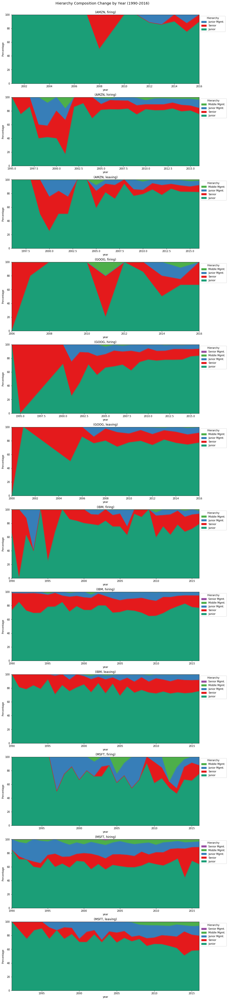

In [33]:
# Hierarchies.
senior_lst = {1:"Junior", 2:"Senior", 3:"Junior Mgmt.", 4:"Middle Mgmt.", 5:"Senior Mgmt."}
colormap_unif = {int(idx+1):clr for idx, clr in zip(
    range(len(senior_lst)),
    itertools.cycle([plt.get_cmap('Dark2').colors[0]]+list(plt.get_cmap('Set1').colors))
)}

# Plot composition changes by years.
fig, axs = plt.subplots(12,1,figsize=(13.5,72))
fig.suptitle("Hierarchy Composition Change by Year (1990-2016)", fontsize='x-large', y=0.89)
for (idx, grp), ax in zip(
    empl_top1k_jobs_df.loc[
        lambda df:(df.year>=1990)&(df.year<=2016), ['ticker','type','year','senior0']
    ].groupby(['ticker','type']), axs
):
    to_plot = grp.loc[lambda df:[int(x)>=f_none_hidden for x in df.senior0]].assign(count = 1).pivot_table(
        index='year', columns='senior0', values='count', aggfunc='sum', fill_value=0 
    ).apply(lambda x:x/sum(x)*100, axis=1)
    to_plot.plot(
        kind='area', ax=ax, color=[colormap_unif[int(float(idx))] for idx in to_plot.columns],
        ylim=(0,100), title=str(idx).replace("'","")
    )
    ax.set_ylabel("Percentage")
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(
        reversed(handles), [senior_lst[int(float(x))] for x in reversed(labels)], 
        loc='upper left',bbox_to_anchor=(1,1),title="Hierarchy"
    )
plt.show()